In [112]:
import networkx as nx
M = nx.read_gml('polblogs1.gml', label='label')#, label='tag')

In [113]:
print(M)

DiGraph with 1490 nodes and 12758 edges


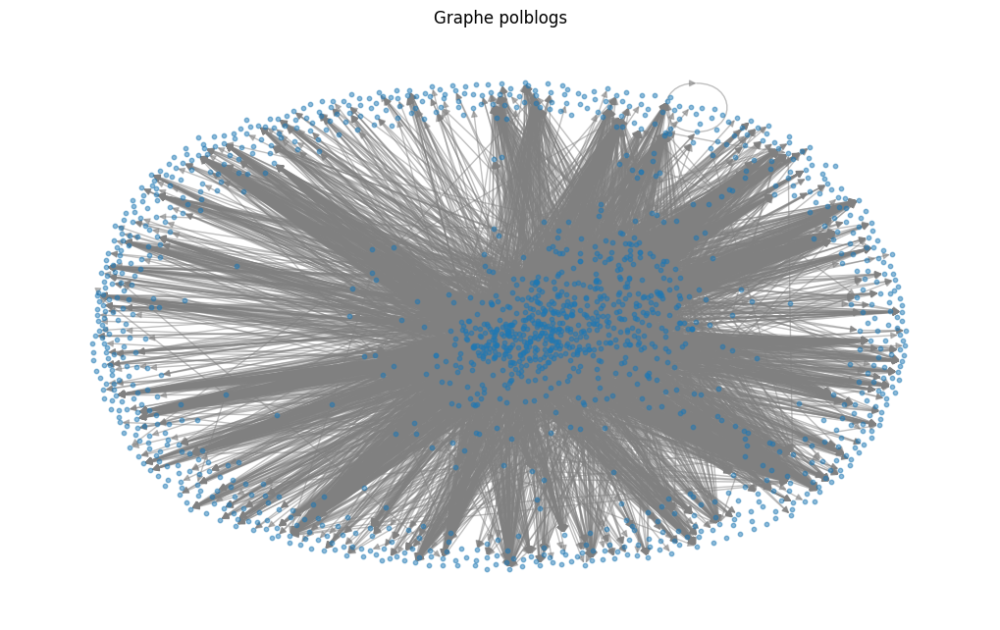

In [16]:

import matplotlib.pyplot as plt

# Visualiser le graphe
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(M, seed=42)  # Disposition des nœuds
nx.draw(M, pos, node_size=10, with_labels=False, edge_color='gray', alpha=0.5)
plt.title("Graphe polblogs")
plt.show()

In [17]:
# Vérifier le nombre de nœuds et de liens
print("Nombre de nœuds :", M.number_of_nodes())
print("Nombre de liens :", M.number_of_edges())

Nombre de nœuds : 1490
Nombre de liens : 12758


In [111]:

# Calculer les degrés entrants des nœuds
in_degree = M.in_degree()

# Calculer les degrés sortants des nœuds
out_degree = M.out_degree()

# Afficher les degrés de quelques nœuds
nodes = ['x-pollen.com/many/blog.html', '100monkeystyping.com', 'aboutpolitics.blogspot.com']  # Exemple de nœuds à vérifier
for node in nodes:
    in_deg = in_degree[node]
    out_deg = out_degree[node]
    print("Noeud", node, "- Degré entrant :", in_deg, "- Degré sortant :", out_deg)

Noeud x-pollen.com/many/blog.html - Degré entrant : 0 - Degré sortant : 5
Noeud 100monkeystyping.com - Degré entrant : 9 - Degré sortant : 0
Noeud aboutpolitics.blogspot.com - Degré entrant : 11 - Degré sortant : 0


In [5]:
list(M.nodes)[:10]

['100monkeystyping.com',
 '12thharmonic.com/wordpress',
 '40ozblog.blogspot.com',
 '4lina.tblog.com',
 '750volts.blogspot.com',
 '95theses.blogspot.com',
 'abbadabbaduo.blogspot.com',
 'aboutpolitics.blogspot.com',
 'achingandspinning.blogspot.com',
 'ackackack.com']

In [6]:
list(M.edges)[:10]

[('12thharmonic.com/wordpress', 'talkingpointsmemo.com'),
 ('12thharmonic.com/wordpress', 'amleft.blogspot.com'),
 ('12thharmonic.com/wordpress', 'needlenose.com'),
 ('12thharmonic.com/wordpress', 'raedinthemiddle.blogspot.com'),
 ('12thharmonic.com/wordpress', 'riverbendblog.blogspot.com'),
 ('12thharmonic.com/wordpress', '100monkeystyping.com'),
 ('12thharmonic.com/wordpress', 'allspinzone.blogspot.com'),
 ('12thharmonic.com/wordpress', 'msnbc.msn.com/id/3449870'),
 ('12thharmonic.com/wordpress', 'americablog.org'),
 ('12thharmonic.com/wordpress', 'reachm.com/amstreet')]

In [6]:
list(M.neighbors('blogs.salon.com/0002874'))

['tbogg.blogspot.com',
 'sadlyno.com',
 'reachm.com/amstreet',
 'patriotboy.blogspot.com',
 'rogerailes.blogspot.com',
 'atrios.blogspot.com',
 'billmon.org',
 'norbizness.com',
 'home.earthlink.net/~fsrhine',
 'thepoorman.net',
 'tomburka.com',
 'dneiwert.blogspot.com',
 'suburbanguerrilla.blogspot.com',
 'nomoremister.blogspot.com',
 'pandagon.net',
 'rittenhouse.blogspot.com',
 'livejournal.com/users/jmhm',
 'busybusybusy.com',
 'scripting.com',
 'nationalreview.com/thecorner',
 'freerepublic.com',
 'powerlineblog.com',
 'michellemalkin.com',
 'americablog.blogspot.com',
 'hughhewitt.com',
 'instapundit.com']

In [8]:
# Trouver le nœud suivi par le plus grand nombre
in_degree = M.in_degree()
max_in_degree_node = None
max_in_degree_count = -1

for node, in_degree_count in in_degree:
    if in_degree_count > max_in_degree_count:
        max_in_degree_count = in_degree_count
        max_in_degree_node = node

In [9]:
# Trouver le nœud qui suit le moins de monde
out_degree = M.out_degree()
min_out_degree_node = None
min_out_degree_count = float('inf')  # Utiliser infini comme point de départ

for node, out_degree_count in out_degree:
    if out_degree_count < min_out_degree_count:
        min_out_degree_count = out_degree_count
        min_out_degree_node = node


print(f"Blog suivi par le plus grand nombre : {max_in_degree_node} (Nombre de suiveurs : {max_in_degree_count})")
print(f"Blog qui suit le moins de monde : {min_out_degree_node} (Nombre de personnes suivies : {min_out_degree_count})")

Blog suivi par le plus grand nombre : dailykos.com (Nombre de suiveurs : 216)
Blog qui suit le moins de monde : 100monkeystyping.com (Nombre de personnes suivies : 0)


In [10]:
list(M.successors('dailykos.com'))

[]

In [107]:
source_node = 'dailykos.com'
target_node = '12thharmonic.com/wordpress'
path_length = 3
all_paths = nx.all_simple_paths(G, source=source_node, target=target_node, cutoff=path_length)
print("Nombre de chemins de longueur", path_length,"entre",source_node,'et',target_node,":", len(list(all_paths)))


Nombre de chemins de longueur 3 entre dailykos.com et 12thharmonic.com/wordpress : 0


In [19]:

# Calculer l'analyse d'influence (PageRank)
influence = nx.pagerank(M)

# Afficher les nœuds les plus influents
top_influential_nodes = sorted(influence, key=influence.get, reverse=True)[:10]
print("10 noeuds les plus influents :", top_influential_nodes)


10 noeuds les plus influents : ['blogsforbush.com', 'dailykos.com', 'drudgereport.com', 'instapundit.com', 'michellemalkin.com', 'atrios.blogspot.com', 'talkingpointsmemo.com', 'littlegreenfootballs.com/weblog', 'powerlineblog.com', 'andrewsullivan.com']


In [11]:
import networkx as nx

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Calculer la centralité des nœuds
centrality = nx.degree_centrality(G)

# Afficher les nœuds les plus centraux
top_nodes = sorted(centrality, key=centrality.get, reverse=True)[:10]
print("Noeuds les plus centraux :", top_nodes)

Noeuds les plus centraux : ['instapundit.com', 'dailykos.com', 'washingtonmonthly.com', 'gevkaffeegal.typepad.com/the_alliance', 'hughhewitt.com', 'talkingpointsmemo.com', 'powerlineblog.com', 'wizbangblog.com', 'michellemalkin.com', 'atrios.blogspot.com']


In [13]:
import networkx as nx
import matplotlib.pyplot as plt

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Calculer la centralité d'intermédiarité (betweenness centrality)
betweenness_centrality = nx.betweenness_centrality(G)

# Trier les nœuds par leur centralité d'intermédiarité
sorted_nodes = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Afficher les 10 nœuds les plus centraux
print("Les 10 nœuds les plus centraux selon la centralité d'intermédiarité(betweenness centrality) :")
for node, centrality in sorted_nodes[:10]:
    print(f"Nœud {node}: Centralité d'intermédiarité = {centrality}")


Les 10 nœuds les plus centraux selon la centralité d'intermédiarité(betweenness centrality) :
Nœud instapundit.com: Centralité d'intermédiarité = 0.03747588632095101
Nœud gevkaffeegal.typepad.com/the_alliance: Centralité d'intermédiarité = 0.022818290149811345
Nœud digbysblog.blogspot.com: Centralité d'intermédiarité = 0.018298043781231628
Nœud washingtonmonthly.com: Centralité d'intermédiarité = 0.018135145679285154
Nœud madkane.com/notable.html: Centralité d'intermédiarité = 0.017540120163650134
Nœud hughhewitt.com: Centralité d'intermédiarité = 0.01614881470514718
Nœud newleftblogs.blogspot.com: Centralité d'intermédiarité = 0.01578252427141429
Nœud wizbangblog.com: Centralité d'intermédiarité = 0.015548949239245347
Nœud southknoxbubba.net/skblog: Centralité d'intermédiarité = 0.011380220082117243
Nœud aintnobaddude.com: Centralité d'intermédiarité = 0.011171468795261947


In [93]:

# Trouver les points de contrôle (articulations)
articulation_nodes = list(nx.articulation_points(G.to_undirected()))

# Afficher les individus relais
print("Individus relais (points de contrôle) :", articulation_nodes)

Individus relais (points de contrôle) : ['750volts.blogspot.com', 'wonkette.com', 'dailyblatt.blogspot.com', 'nielsenhayden.com/makinglight', 'greaterdemocracy.org', 'kensain.com', 'ibe.blogspot.com', 'dewar.journalspace.com', 'ludovicspeaks.typepad.com/real_deal', 'takebackthemedia.com', 'lennonreport.blogspot.com', 'snunes.blogspot.com', 'billroggio.com/easongate', 'sccdp.org/blog.php', 'moorewatch.com', 'jlynnsmith30.blogspot.com', 'thejessefactor.blogspot.com', 'roseoftheknights.com/yank/pride.html', 'patriot-paradox.com', 'streetlog.typepad.com', 'southernappeal.blogspot.com', 'zeke01.typepad.com', 'poweragerambleson.blogspot.com', 'thepatriette.com', 'anncoulter.org', 'poliblogger.com', 'nathancallahan.com', 'thinkingright.us', 'rosenblog.com', 'writingcompany.blogs.com/this_isnt_writing_its_typ', 'thelastword.blogdrive.com', 'mariestwocents.blogspot.com', 'homespunbloggers.blogspot.com', 'jquinton.com', 'everythingiknowiswrong.com', 'thepoliticalteen.net', 'blogsforbush.com', 'i

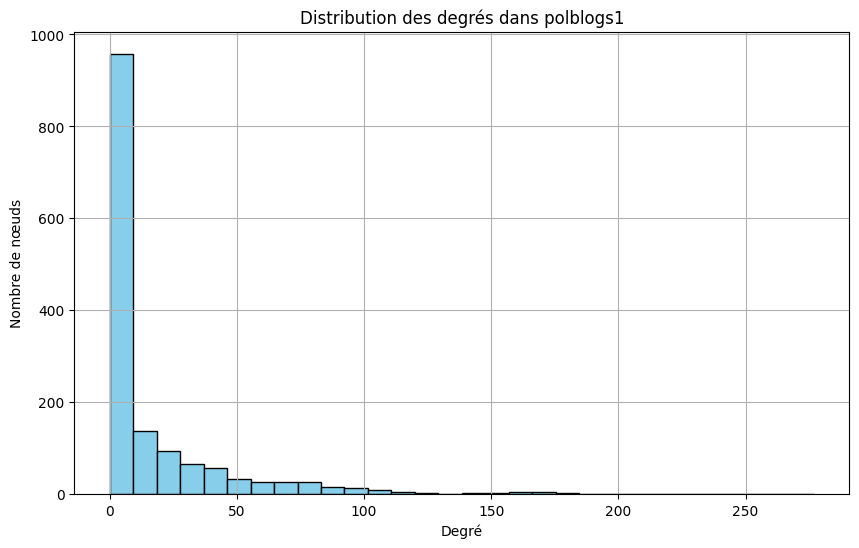

In [14]:


# Obtenir les degrés des nœuds
degrees = [deg for node, deg in G.degree()]

# Tracer l'histogramme
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution des degrés dans polblogs1")
plt.xlabel("Degré")
plt.ylabel("Nombre de nœuds")
plt.grid(True)
plt.show()


In [28]:


# Algorithme de détection de communautés basé sur la modularité
communities = list(nx.algorithms.community.modularity_max.greedy_modularity_communities(G))

# Créer un dictionnaire pour regrouper les nœuds par communauté
community_dict = {}
for i, community in enumerate(communities):
    for node in community:
        if i in community_dict:
            community_dict[i].append(node)
        else:
            community_dict[i] = [node]

# Afficher les communautés et les nœuds qu'elles contiennent
for community, nodes in community_dict.items():
 
    print("Communauté :", community)
    print("Noeuds :", nodes)
    print()

Communauté : 0
Noeuds : ['discerningtexan.blogspot.com', 'fearfulsymmetry.blogspot.com', 'danzfamily.com', 'wholewheatblogger.com', 'r2korn.blogdrive.com', 'politicaltracker.com/blog/weblog.php', 'horologium.net', 'ogresview.blogspot.com', 'realclearpolitics.com', 'thedailygoodnews.com', 'cubanstories.blogspot.com', 'bittersweetme.net/blog/index.php', 'hectorvex.blogspot.com', 'mtvirtus.blogspot.com', 'billroggio.com/easongate', 'theliberalslies.blogspot.com', 'emilythedog.blogspot.com', 'andrewsullivan.com', 'astrosoup.blogspot.com', 'mementomoron.blogspot.com', 'economicswithaface.com/weblog', 'dartblog.com', 'metallicity.com/mb.asp', 'rightwingtroll.blogspot.com', 'dynamist.com/weblog', 'poliblogger.com', 'templeofjennifer.com/blog', 'mdcbowen.org/cobb', 'apologiesdemanded.blogspot.com', 'jquinton.com', 'gotdesign.blogspot.com', 'legendgames.net/myblog.asp', 'julietterossant.com/superchefblog/superchefblog.html', 'commonsenserunswild.typepad.com', 'interested-participant.blogspot.co

In [110]:

# Trouver les k-cliques pour k donné
k = 4  # Exemple de taille de k-clique
k_cliques = list(nx.find_cliques(G.to_undirected()))

# Filtrer les k-cliques de taille k
k_cliques_size_k = [clique for clique in k_cliques if len(clique) == k]

# Afficher les k-cliques trouvés
print("Les", k, "-cliques dans le graphe sont les suivants :")
for clique in (k_cliques_size_k):
    print(clique)


Les 4 -cliques dans le graphe sont les suivants :
['wholewheatblogger.com', 'littlegreenfootballs.com/weblog', 'jihadwatch.org', 'michellemalkin.com']
['wholewheatblogger.com', 'littlegreenfootballs.com/weblog', 'jihadwatch.org', 'jewishworldreview.com']
['wholewheatblogger.com', 'littlegreenfootballs.com/weblog', 'jewishworldreview.com', 'drudgereport.com']
['wholewheatblogger.com', 'littlegreenfootballs.com/weblog', 'hughhewitt.com', 'michellemalkin.com']
['wholewheatblogger.com', 'littlegreenfootballs.com/weblog', 'hughhewitt.com', 'truthlaidbear.com']
['bodyandsoul.typepad.com', 'worldonfire.typepad.com/world_on_fire', 'ruminatethis.com', 'newleftblogs.blogspot.com']
['bodyandsoul.typepad.com', 'riverbendblog.blogspot.com', '12thharmonic.com/wordpress', 'raedinthemiddle.blogspot.com']
['bodyandsoul.typepad.com', 'bullmooseblog.com', 'billmon.org', 'uggabugga.blogspot.com']
['bodyandsoul.typepad.com', 'deathpenaltyusa.blogspot.com', 'newleftblogs.blogspot.com', 'demagogue.blogspot.c

In [30]:
import networkx as nx
import numpy as np

def modularity(G, partition):
    m = G.number_of_edges()
    q = 0
    for i in partition:
        ki = sum(G.degree(j) for j in partition[i])
        for j in partition[i]:
            kj = G.degree(j)
            if G.has_edge(i, j):
                q += (1 - ki*kj/(2*m))
            else:
                q += (- ki*kj/(2*m))
    return q/(2*m)

def louvain(G):
    partition = {node: [node] for node in G.nodes()}  # Initial partition where each node is in its own community
    prev_modularity = modularity(G, partition)
    current_modularity = -1  # Initialize current modularity to a value smaller than prev_modularity
    while current_modularity > prev_modularity:
        prev_modularity = current_modularity
        for node in G.nodes():
            neighbors = list(G.neighbors(node))
            max_modularity_gain = 0
            best_community = None
            current_community = partition[node]
            for neighbor in neighbors:
                partition[neighbor].remove(neighbor)
                partition[node] = current_community + [neighbor]
                modularity_gain = modularity(G, partition) - prev_modularity
                if modularity_gain > max_modularity_gain:
                    max_modularity_gain = modularity_gain
                    best_community = partition[node]
                partition[neighbor].append(neighbor)
                partition[node] = current_community
            if best_community:
                partition[node] = best_community
        current_modularity = modularity(G, partition)
    return partition

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Exécuter l'algorithme de Louvain
partition = louvain(G)

# Afficher le nombre de communautés détectées
num_communities = len(set(tuple(partition[node]) for node in G.nodes()))
print("Nombre de communautés détectées par Louvain :", num_communities)


Nombre de communautés détectées par Louvain : 1490


In [39]:
import igraph as ig

# Exécuter l'algorithme Infomap
infomap = G.community_infomap()

# Afficher les communautés détectées
print("Communautés détectées avec Infomap:", infomap)


Communautés détectées avec Infomap: Clustering with 1490 elements and 469 clusters
[  0] 0, 1, 6, 8, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 27, 30,
      33, 34, 35, 36, 38, 39, 41, 45, 46, 50, 51, 52, 54, 55, 63, 65, 66, 67,
      71, 72, 74, 78, 81, 82, 85, 86, 87, 88, 89, 92, 96, 97, 98, 99, 100,
      101, 102, 103, 104, 105, 106, 108, 112, 113, 114, 115, 117, 120, 122,
      123, 124, 129, 131, 136, 139, 140, 141, 142, 143, 144, 148, 149, 150,
      153, 154, 156, 158, 161, 162, 164, 165, 166, 167, 169, 171, 176, 177,
      179, 180, 184, 185, 186, 187, 188, 189, 190, 191, 193, 199, 200, 201,
      203, 204, 206, 208, 209, 210, 214, 217, 222, 223, 226, 228, 232, 237,
      240, 242, 243, 245, 247, 251, 255, 256, 258, 261, 263, 267, 271, 272,
      273, 274, 277, 278, 280, 281, 287, 289, 290, 291, 292, 294, 296, 297,
      298, 299, 300, 304, 306, 307, 310, 312, 313, 314, 315, 316, 317, 320,
      322, 325, 327, 328, 330, 331, 334, 336, 337, 340, 343, 346, 348, 349,
   

In [44]:

# Calculer le coefficient de clustering pour chaque nœud
clustering_coefficients = nx.clustering(G)

# Calculer le coefficient de clustering moyen
average_clustering = nx.average_clustering(G)

print("Coefficient de clustering moyen :", average_clustering)


Coefficient de clustering moyen : 0.11494501248778989


In [45]:
# Calculer la densité du graphe
density = nx.density(G)

print("Densité du graphe :", density)


Densité du graphe : 0.0057504473521709535


In [48]:

# Vérifier si le graphe est fortement connecté
is_strongly_connected = nx.is_strongly_connected(G)

if is_strongly_connected:
    # Effectuer l'analyse des chemins
    average_shortest_path_length = nx.average_shortest_path_length(G)
    diameter = nx.diameter(G)
    print("Longueur moyenne des chemins :", average_shortest_path_length)
    print("Diamètre du graphe :", diameter)
else:
    print("Le graphe n'est pas fortement connecté.")


Le graphe n'est pas fortement connecté.


In [50]:
# Vérifier si le graphe est fortement connecté
if nx.is_strongly_connected(G):
    # Calculer la longueur moyenne des chemins et le diamètre
    average_shortest_path_length = nx.average_shortest_path_length(G)
    diameter = nx.diameter(G)
    print("Longueur moyenne des chemins :", average_shortest_path_length)
    print("Diamètre du graphe :", diameter)
else:
    print("Le graphe n'est pas fortement connecté. Certaines mesures de cheminement ne sont pas applicables.")



Le graphe n'est pas fortement connecté. Certaines mesures de cheminement ne sont pas applicables.


In [54]:
import networkx as nx

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Trouver tous les composants connectés
connected_components = list(nx.weakly_connected_components(G))

# Afficher le nombre de composants connectés
print("Nombre de composants connectés :", len(connected_components))

# Afficher la taille de chaque composant connecté
for i, component in enumerate(connected_components):
    print("Taille du composant connecté", i+1, ":", len(component))


Nombre de composants connectés : 425
Taille du composant connecté 1 : 1062
Taille du composant connecté 2 : 1
Taille du composant connecté 3 : 1
Taille du composant connecté 4 : 1
Taille du composant connecté 5 : 1
Taille du composant connecté 6 : 1
Taille du composant connecté 7 : 1
Taille du composant connecté 8 : 1
Taille du composant connecté 9 : 1
Taille du composant connecté 10 : 1
Taille du composant connecté 11 : 1
Taille du composant connecté 12 : 1
Taille du composant connecté 13 : 1
Taille du composant connecté 14 : 1
Taille du composant connecté 15 : 1
Taille du composant connecté 16 : 1
Taille du composant connecté 17 : 1
Taille du composant connecté 18 : 1
Taille du composant connecté 19 : 1
Taille du composant connecté 20 : 1
Taille du composant connecté 21 : 1
Taille du composant connecté 22 : 1
Taille du composant connecté 23 : 1
Taille du composant connecté 24 : 1
Taille du composant connecté 25 : 1
Taille du composant connecté 26 : 1
Taille du composant connecté 27 :

In [55]:
# Trouver le plus grand composant connecté
largest_connected_component = max(nx.weakly_connected_components(G), key=len)

# Afficher la taille du plus grand composant connecté
print("Taille du plus grand composant connecté :", len(largest_connected_component))


Taille du plus grand composant connecté : 1062


In [74]:


# Obtenir tous les attributs pour chaque nœud
node_attributes = nx.get_node_attributes(G, "Value")

# Afficher les attributs pour les premiers nœuds
for node, attributes in list(node_attributes.items())[:10]:  # Affiche les 10 premiers nœuds et leurs attributs
    print("Noeud :", node)
    print("Attributs :", attributes)


In [78]:
import networkx as nx

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Récupérer les attributs numériques de chaque nœud
node_attributes = {node: G.nodes[node]["value"] for node in G.nodes()}

# Afficher les attributs pour les premiers nœuds
for node, attribute in list(node_attributes.items())[:10]:  # Affiche les 10 premiers nœuds et leurs attributs
    print("Noeud :", node)
    print("Attribut :", attribute)


Noeud : 100monkeystyping.com
Attribut : 0
Noeud : 12thharmonic.com/wordpress
Attribut : 0
Noeud : 40ozblog.blogspot.com
Attribut : 0
Noeud : 4lina.tblog.com
Attribut : 0
Noeud : 750volts.blogspot.com
Attribut : 0
Noeud : 95theses.blogspot.com
Attribut : 0
Noeud : abbadabbaduo.blogspot.com
Attribut : 0
Noeud : aboutpolitics.blogspot.com
Attribut : 0
Noeud : achingandspinning.blogspot.com
Attribut : 0
Noeud : ackackack.com
Attribut : 0


In [114]:
import networkx as nx
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Générer des caractéristiques aléatoires pour les nœuds
node_features = {node: np.random.rand(5) for node in G.nodes()}  # Exemple de 5 caractéristiques aléatoires

# Générer des étiquettes pour les nœuds
node_labels = {node: G.nodes[node]['value'] for node in G.nodes()}  # Suppose que les étiquettes sont stockées dans l'attribut 'value'

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(list(node_features.values()), list(node_labels.values()), test_size=0.2, random_state=42)

# Créer un modèle KNN
knn = KNeighborsClassifier(n_neighbors=5) 

# Entraîner le modèle
knn.fit(X_train, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred = knn.predict(X_test)

# Calculer la précision du modèle
accuracy = accuracy_score(y_test, y_pred)
print("Précision du modèle KNN :", accuracy)

Précision du modèle KNN : 0.5067114093959731


In [116]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Récupérer la liste des arêtes
edges = list(G.edges())

# Générer les étiquettes en fonction de la présence d'arêtes
y = np.array([1 if G.has_edge(u, v) else 0 for u, v in edges])

# Générer les caractéristiques (ici, nous utilisons simplement des valeurs aléatoires pour illustrer)
X = np.random.rand(len(edges), 1)  # Vous devez remplacer cette ligne par la construction de vos caractéristiques réelles

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer et entraîner un modèle de Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred = rf.predict(X_test)

# Évaluer les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
print("Précision du modèle Random Forest :", accuracy)



Précision du modèle Random Forest : 1.0


In [120]:
import networkx as nx
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score

# Récupérer la liste des arêtes
edges = list(G.edges())

# Générer les étiquettes en fonction de la présence d'arêtes
y = np.array([1 if G.has_edge(u, v) else 0 for u, v in edges])

# Générer les caractéristiques pour chaque paire de nœuds (ici, nous utilisons simplement des valeurs aléatoires pour illustrer)
X = np.random.rand(len(edges), 1)  
# Appliquer l'algorithme K-means pour regrouper les paires de nœuds en clusters
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X)

# Convertir les clusters en prédictions (0 ou 1) en fonction de la majorité des étiquettes dans chaque cluster
predictions = np.zeros_like(clusters)
for i in range(2):
    mask = (clusters == i)
    majority_label = np.argmax(np.bincount(y[mask]))
    predictions[mask] = majority_label

# Évaluer les performances du modèle
accuracy = accuracy_score(y, predictions)
print("Précision du modèle K-means :", accuracy)


Précision du modèle K-means : 1.0


In [94]:
import networkx as nx

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Fonction pour calculer la densité du voisinage commun pour un nœud donné
def neighborhood_density(G, node):
    neighbors = set(G.neighbors(node))
    total_density = 0
    for neighbor1 in neighbors:
        for neighbor2 in neighbors:
            if neighbor1 != neighbor2:
                common_neighbors = set(G.neighbors(neighbor1)).intersection(set(G.neighbors(neighbor2)))
                if len(common_neighbors) > 0:
                    total_density += len(common_neighbors) / ((len(set(G.neighbors(neighbor1))) + len(set(G.neighbors(neighbor2)))) / 2)
    return total_density / len(neighbors) if len(neighbors) > 0 else 0

# Calculer la densité du voisinage commun pour chaque nœud
neighborhood_densities = {node: neighborhood_density(G, node) for node in G.nodes()}

# Afficher la densité du voisinage commun pour certains nœuds
for node, density in neighborhood_densities.items():
    print("Densité du voisinage commun pour le nœud", node, ":", density)


Densité du voisinage commun pour le nœud 100monkeystyping.com : 0
Densité du voisinage commun pour le nœud 12thharmonic.com/wordpress : 3.323120730914169
Densité du voisinage commun pour le nœud 40ozblog.blogspot.com : 0
Densité du voisinage commun pour le nœud 4lina.tblog.com : 0
Densité du voisinage commun pour le nœud 750volts.blogspot.com : 0.0
Densité du voisinage commun pour le nœud 95theses.blogspot.com : 0.0
Densité du voisinage commun pour le nœud abbadabbaduo.blogspot.com : 0
Densité du voisinage commun pour le nœud aboutpolitics.blogspot.com : 0
Densité du voisinage commun pour le nœud achingandspinning.blogspot.com : 0.2235241502683363
Densité du voisinage commun pour le nœud ackackack.com : 0.8860155765427015
Densité du voisinage commun pour le nœud adamtalib.blogspot.com : 0
Densité du voisinage commun pour le nœud adviceforlefty.blogspot.com : 0.0
Densité du voisinage commun pour le nœud agonist.org : 1.6366853609557195
Densité du voisinage commun pour le nœud aintnobadd

In [ ]:


# Calculer la similarité de Jaccard dirigée entre les nœuds
node_similarity = {}
for node1 in G.nodes():
    for node2 in G.nodes():
        if node1 != node2:
            predecessors1 = set(G.predecessors(node1))
            predecessors2 = set(G.predecessors(node2))
            common_predecessors = len(predecessors1.intersection(predecessors2))
            union_predecessors = len(predecessors1.union(predecessors2))
            if union_predecessors != 0:
                similarity = common_predecessors / union_predecessors
            else:
                similarity = 0  # Éviter la division par zéro
            if node1 in node_similarity:
                node_similarity[node1][node2] = similarity
            else:
                node_similarity[node1] = {node2: similarity}

# Afficher la similarité entre certains nœuds
for node1, similarities in node_similarity.items():
    for node2, similarity in similarities.items():
        print("Similarité de Jaccard dirigée entre les nœuds", node1, "et", node2, ":", similarity)


Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et 12thharmonic.com/wordpress : 0.08333333333333333
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et 40ozblog.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et 4lina.tblog.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et 750volts.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et 95theses.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et abbadabbaduo.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et aboutpolitics.blogspot.com : 0.1111111111111111
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et achingandspinning.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et ackackack.com : 0.0
Similarité de Jaccard dirigée entre les nœuds 100monkeystyping.com et adamtali

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



 et arkansastonight.com : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et asian-nation.org/headlines/index.php : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et asiegeofherons.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et asilentrevolution.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et askhoudari.blogspot.com : 0.022727272727272728
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et astroturf.uni.cc : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et atease.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et atomicairship.com : 0.0
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et atrios.blogspot.com : 0.21022727272727273
Similarité de Jaccard dirigée entre les nœuds americablog.blogspot.com et atrios.blogspot.com/  : 0.0


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



askhoudari.blogspot.com et vapolitics.info : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et variousorthodoxies.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et victorhanson.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et viewfromaheight.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et viewfromtonka.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et viewpointjournal.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et vikingpundit.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et virginiapolitics.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et vodkapundit.com : 0.0
Similarité de Jaccard dirigée entre les nœuds askhoudari.blogspot.com et voiceofthewebb.blogspot.com : 0.0
Similarité de Jaccard d

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




Similarité de Jaccard dirigée entre les nœuds blogitics.com et busybusybusy.com : 0.02631578947368421
Similarité de Jaccard dirigée entre les nœuds blogitics.com et buzzmachine.com : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et cadat.nl : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et carpetblogger.com : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et catchingsmoke.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et cbaker.org/blog : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et cemonitor.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et centerpiece.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et chak.org/blog : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et changeforamerica.com/blog : 0.0
Similarité de Jaccard dirigée entre les nœuds blogitics.com et charleypatton.blogspot.com : 0.0
Simila

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



 et bluestateredstate.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et bodyandsoul.typepad.com : 0.05405405405405406
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et boffo.typepad.com : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et boloboffin.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et bopnews.com : 0.06818181818181818
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et boston.com/news/blogs/dnc : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et bowles2004.com/weblog : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et boycottsbg.com : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et bradcarson.com/blog : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et bradfriedman.com/bradblog : 0.0
Similarité de Jaccard dirigée entre les nœuds buzzmachine.com et brianhull.net : 0.0
Similarité de Ja

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



0.0
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et btcnews.com/btcnews : 0.0625
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et bullmooseblog.com : 0.09375
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et burntorangereport.com : 0.12195121951219512
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et bushlies.net/pages/10/index.htm : 0.0
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et bushmisunderestimated.blogspot.com : 0.0
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et busybusybusy.com : 0.0625
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et buzzmachine.com : 0.028985507246376812
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et cadat.nl : 0.0
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et carpetblogger.com : 0.0
Similarité de Jaccard dirigée entre les nœuds davidsirota.com et catchingsmoke.blogspot.com : 0.0
Similarité de Jaccard dirigée

In [119]:
import networkx as nx

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Calculer la similarité de Jaccard entre toutes les paires de nœuds non connectées
non_edges = list(nx.non_edges(G))
jaccard_similarity = {}
for u, v in non_edges:
    neighbors_u = set(G.neighbors(u))
    neighbors_v = set(G.neighbors(v))
    if neighbors_u and neighbors_v:  # Vérifier que les ensembles de voisins ne sont pas vides
        jaccard_similarity[(u, v)] = len(neighbors_u.intersection(neighbors_v)) / len(neighbors_u.union(neighbors_v))

# Trier les paires de nœuds non connectées par ordre de similarité de Jaccard décroissante
sorted_jaccard_similarity = sorted(jaccard_similarity.items(), key=lambda x: x[1], reverse=True)

# Afficher les paires de nœuds non connectées avec la plus haute similarité de Jaccard
num_missing_links = 10  # Nombre de liens manquants à afficher
print("Top", num_missing_links, "liens manquants prédits :")
for i, (nodes, similarity) in enumerate(sorted_jaccard_similarity[:num_missing_links]):
    print("Paire de nœuds :", nodes, "Similarité de Jaccard :", similarity)


Top 10 liens manquants prédits :
Paire de nœuds : ('allanjenkins.typepad.com', 'jeremybrendan.blogspot.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('angryhomo.blogspot.com', 'woneffe.typepad.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('eastbaykerry.com', 'openeyesmemo.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('forewarned.blogspot.com', 'ilovecynics.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('forewarned.blogspot.com', 'nycitystoop.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('forewarned.blogspot.com', 'planetdave.com/blogs.php3?mid=1') Similarité de Jaccard : 1.0
Paire de nœuds : ('forewarned.blogspot.com', 'charlesking.blogspot.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('forewarned.blogspot.com', 'journals.aol.com/mark24609/myblog') Similarité de Jaccard : 1.0
Paire de nœuds : ('idiosyncratictendencies.com', 'liberaleric.blogspot.com') Similarité de Jaccard : 1.0
Paire de nœuds : ('ilovecynics.com', 'forewarned.blogspot.com') Similarité

In [123]:

import networkx as nx

# Charger le graphe
G = nx.read_gml("polblogs1.gml")

# Trouver les composantes fortement connectées
strongly_connected_components = list(nx.strongly_connected_components(G))

# Calculer l'excentricité pour chaque composante fortement connectée
for component in strongly_connected_components:
    subgraph = G.subgraph(component)
    eccentricity = nx.eccentricity(subgraph)
    print("Composante fortement connectée :", component)
    print("Excentricité de chaque nœud :", eccentricity)
    print()


Composante fortement connectée : {'100monkeystyping.com'}
Excentricité de chaque nœud : {'100monkeystyping.com': 0}

Composante fortement connectée : {'talkingpointsmemo.com'}
Excentricité de chaque nœud : {'talkingpointsmemo.com': 0}

Composante fortement connectée : {'dailykos.com'}
Excentricité de chaque nœud : {'dailykos.com': 0}

Composante fortement connectée : {'atrios.blogspot.com'}
Excentricité de chaque nœud : {'atrios.blogspot.com': 0}

Composante fortement connectée : {'juancole.com'}
Excentricité de chaque nœud : {'juancole.com': 0}

Composante fortement connectée : {'andrewsullivan.com'}
Excentricité de chaque nœud : {'andrewsullivan.com': 0}

Composante fortement connectée : {'bopnews.com'}
Excentricité de chaque nœud : {'bopnews.com': 0}

Composante fortement connectée : {'bradfriedman.com/bradblog'}
Excentricité de chaque nœud : {'bradfriedman.com/bradblog': 0}

Composante fortement connectée : {'dailyhowler.com'}
Excentricité de chaque nœud : {'dailyhowler.com': 0}

C

In [124]:

# Trouver le minimum de l'excentricité de tous les nœuds
min_eccentricity = min(eccentricity.values())

# Identifier les nœuds dont l'excentricité est égale au minimum
center_nodes = [node for node, ecc in eccentricity.items() if ecc == min_eccentricity]

# Afficher les nœuds du centre
print("Le centre du graphe :", center_nodes)

Nœuds du centre du graphe : ['zeph1z.tripod.com/blog']
